In [24]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
import csv
import pandas as pd

In [469]:
test_img_path = '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/16_16_16_clear_16000000.bmp'
blue_ima_path = '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/16_16_16_Z_21000000.bmp'
green_ima_path = '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/16_16_16_Y_12500000.bmp'


In [2]:
def extract_middle_roi(image, target_width):
    """
    Extract the middle region of an image with a specified target width.

    Args:
        image (numpy.ndarray): Input image.
        target_width (int): Desired width of the extracted region.

    Returns:
        numpy.ndarray: Extracted middle region of the image.
    """
    height, width = image.shape[:2]
    aspect_ratio = width / height
    target_height = int(target_width / aspect_ratio)
    x = int((width - target_width) / 2)
    y = int((height - target_height) / 2)
    x2 = x + target_width
    y2 = y + target_height
    middle_roi = image[y:y2, x:x2]
    return middle_roi

In [3]:
def preprocess_image(image_path, threshold_val=0):
    """
    Preprocess an image by cropping and thresholding.

    Args:
        image_path (str): Path to the input grayscale image.
        threshold_val (int, optional): Threshold value for image thresholding.

    Returns:
        tuple: Tuple containing threshold value and path to the preprocessed image.
    """
    # Load the grayscale image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Crop image
    image = extract_middle_roi(image, 1500)

    if threshold_val == 0:
        threshold_val = 5
        # Find threshold with sd
        for x in range(5, 10):
            mask = np.where(image < x, 1, 0)
            masked_intensities = image[mask == 1]
            mean_intensity = np.mean(masked_intensities)
            sd_intensity = np.std(masked_intensities)
            two_sd = (mean_intensity + (2 * sd_intensity))
            three_sd = (mean_intensity + (3 * sd_intensity))
            print("current threshold: {}".format(x))
            print("two_sd: {}".format(two_sd))
            print("three_sd: {}".format(three_sd))

            if x >= two_sd and x <= three_sd:
                threshold_val = x
                break

    # Filter out pixels with intensities below the threshold_val
    _, image_filtered = cv2.threshold(image, threshold_val, 255, cv2.THRESH_TOZERO)

    print("Threshold value:", threshold_val)

    # Save and download to local disk
    # Extract the filename from the original image path
    filename = image_path.split("/")[-1]

    # Create the new path by concatenating the desired directory and the filename
    new_path = os.path.dirname(image_path) + "/thresholded/"

    # Create the folder if it doesn't exist
    if not os.path.exists(new_path):
        os.makedirs(new_path)

    new_path += filename

    cv2.imwrite(new_path, image_filtered)

    print("Saved thresholded image to: {}".format(new_path))

    return threshold_val, new_path

In [223]:
def contours_to_df(contours):
    df = pd.DataFrame(columns=["id", "contour"])
    for i in range(0, len(contours)):
        df.loc[i] = [i, contours[i]]
    return df

,id,contour
0,0,"[[[123, 1109]], [[120, 1112]], [[120, 1116]], ..."
1,1,"[[[76, 1109]], [[75, 1110]], [[74, 1110]], [[7..."
2,2,"[[[27, 1109]], [[25, 1111]], [[25, 1112]], [[2..."
3,3,"[[[268, 1108]], [[267, 1109]], [[266, 1109]], ..."
4,4,"[[[221, 1108]], [[220, 1109]], [[218, 1109]], ..."
...,...,...
1475,1475,"[[[1077, 0]], [[1076, 1]], [[1075, 1]], [[1073..."
1476,1476,"[[[1030, 0]], [[1029, 1]], [[1028, 1]], [[1025..."
1477,1477,"[[[983, 0]], [[982, 1]], [[981, 1]], [[980, 2]..."
1478,1478,"[[[935, 0]], [[934, 1]], [[933, 1]], [[932, 2]..."


In [125]:
def sum_contour(contour, image):
    sum = 0
    mask = np.zeros_like(image)
    
    for dot in contour:
        #print([dot[0][0], "   ", dot[0][1]])
        sum = sum + image[dot[0][1], dot[0][0]]
    return sum

In [294]:
def RGB_mask(image_path, output_path, threshold_val=0):
    """
    Preprocess an image by cropping and thresholding.

    Args:
        image_path (str): Path to the input grayscale image.
        threshold_val (int, optional): Threshold value for image thresholding.

    Returns:
        tuple: Tuple containing threshold value and path to the preprocessed image.
    """

    df = pd.DataFrame(columns=['id', 'x', 'y', 'area', 'perimeter', 'total_signal'])

    # Load the grayscale image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Crop image
    image = extract_middle_roi(image, 1500)
 
    # Filter out pixels with intensities below the threshold_val
    _, image_filtered = cv2.threshold(image, threshold_val, 255, cv2.THRESH_TOZERO)


    binary_image = np.where(image_filtered > 0,100,0)
    cv2.imwrite("binary.jpg", binary_image)


    print("Threshold value:", threshold_val)

    # Save and download to local disk
    # Extract the filename from the original image path
    filename = image_path.split("/")[-1]

    # Create the new path by concatenating the desired directory and the filename
    new_path = os.path.dirname(image_path) + "/thresholded/"

    # Create the folder if it doesn't exist
    if not os.path.exists(new_path):
        os.makedirs(new_path)

    for row in range(image_filtered.shape[0]):
        for col in range(image_filtered.shape[1]):
            pixel_value = image_filtered[row, col]
            if pixel_value > 0:
                pass
                #image_filtered[row,col]=255
        

       # if (image[row, col] != 0 and blue_img[row,col]==0):
        #    pixel_value = image[row, col]
         #   blue_pixel_value = blue_img[row, col]
          #  print(f'Pixel at ({row}, {col}): {pixel_value}')
           # print(f'Blue Pixel at ({row}, {col}): {blue_pixel_value}')
            #image[row,col]=0

    contours, _ = cv2.findContours(image_filtered, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    filtered_contours = []
    # Create a copy of the original image
    image_with_rectangles = np.copy(image_filtered)

    
    threshold_area = 100

    id = 0
    for i in range(0, len(contours)):
        contour = contours[i]
    #for contour in contours:
        area = cv2.contourArea(contour)    
             
        if area > threshold_area:  
            filtered_contours.append(contour)
            x, y, w, h = cv2.boundingRect(contour)
            #cv2.rectangle(image_with_rectangles, (x, y), (x + w, y + h), (155), 1)  # Adjust color and thickness as needed
            cv2.drawContours(image_with_rectangles, [contour], -1, 100, 1)

            M = cv2.moments(contour)
            area = M["m00"]
            cX = int(M["m10"] / M["m00"])
            cY = int(M["m01"] / M["m00"])
            # Perimeter
            perimeter = cv2.arcLength(contour, True)
            centroid = [cX, cY]
            cv2.circle(image_with_rectangles, (cX, cY), 0, (0), -1)
            cv2.putText(image_with_rectangles, str(id), (cX - 2, cY - 2), cv2.FONT_HERSHEY_SIMPLEX, 0.5, 255, 1)
            

            signal = sum_contour(contour, image)
            df.loc[len(df.index)] = [id, cX, cY, area, perimeter, signal]
            print("ID :", id)
            id = id + 1
    


                
    #Check the images with bounding rectangles
    cv2.imwrite(output_path, image_with_rectangles)
    




    new_path += filename

    cv2.imwrite(new_path, image_filtered)

    print("Saved thresholded image to: {}".format(new_path))

    return threshold_val, new_path, filtered_contours, df, binary_image

In [417]:
image = cv2.imread(blue_ima_path, cv2.IMREAD_GRAYSCALE)

    # Crop image
image = extract_middle_roi(image, 1500)
_, image_filtered = cv2.threshold(image, 8, 255, cv2.THRESH_TOZERO)


In [470]:
green_image = cv2.imread(green_ima_path, cv2.IMREAD_GRAYSCALE)

    # Crop image
green_image = extract_middle_roi(green_image, 1500)
_, green_image_filtered = cv2.threshold(green_image, 8, 255, cv2.THRESH_TOZERO)

In [408]:
def read_and_extract_roi(path):
    image = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    # Crop image
    image = extract_middle_roi(image, 1500)
    return image

In [283]:
test_img_path = '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/16_16_16_clear_16000000.bmp'
blue_ima_path = '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/16_16_16_Z_21000000.bmp'

a, b, contours, df, binary = RGB_mask(blue_ima_path, 8)
print(type(contours[0]))



Threshold value: 8
ID : 0
ID : 1
ID : 2
ID : 3
ID : 4
ID : 5
ID : 6
ID : 7
ID : 8
ID : 9
ID : 10
ID : 11
ID : 12
ID : 13
ID : 14
ID : 15
ID : 16
ID : 17
ID : 18
ID : 19
ID : 20
ID : 21
ID : 22
ID : 23
ID : 24
ID : 25
ID : 26
ID : 27
ID : 28
ID : 29
ID : 30
ID : 31
ID : 32
ID : 33
ID : 34
ID : 35
ID : 36
ID : 37
ID : 38
ID : 39
ID : 40
ID : 41
ID : 42
ID : 43
ID : 44
ID : 45
ID : 46
ID : 47
ID : 48
ID : 49
ID : 50
ID : 51
ID : 52
ID : 53
ID : 54
ID : 55
ID : 56
ID : 57
ID : 58
ID : 59
ID : 60
ID : 61
ID : 62
ID : 63
ID : 64
ID : 65
ID : 66
ID : 67
ID : 68
ID : 69
ID : 70
ID : 71
ID : 72
ID : 73
ID : 74
ID : 75
ID : 76
ID : 77
ID : 78
ID : 79
ID : 80
ID : 81
ID : 82
ID : 83
ID : 84
ID : 85
ID : 86
ID : 87
ID : 88
ID : 89
ID : 90
ID : 91
ID : 92
ID : 93
ID : 94
ID : 95
ID : 96
ID : 97
ID : 98
ID : 99
ID : 100
ID : 101
ID : 102
ID : 103
ID : 104
ID : 105
ID : 106
ID : 107
ID : 108
ID : 109
ID : 110
ID : 111
ID : 112
ID : 113
ID : 114
ID : 115
ID : 116
ID : 117
ID : 118
ID : 119
ID : 120
ID

In [473]:
green_a, green_b, green_contours, green_df, green_binary = RGB_mask(green_ima_path, "/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/green_contour.jpg", 10)



Threshold value: 10
ID : 0
ID : 1
ID : 2
ID : 3
ID : 4
ID : 5
ID : 6
ID : 7
ID : 8
ID : 9
ID : 10
ID : 11
ID : 12
ID : 13
ID : 14
ID : 15
ID : 16
ID : 17
ID : 18
ID : 19
ID : 20
ID : 21
ID : 22
ID : 23
ID : 24
ID : 25
ID : 26
ID : 27
ID : 28
ID : 29
ID : 30
ID : 31
ID : 32
ID : 33
ID : 34
ID : 35
ID : 36
ID : 37
ID : 38
ID : 39
ID : 40
ID : 41
ID : 42
ID : 43
ID : 44
ID : 45
ID : 46
ID : 47
ID : 48
ID : 49
ID : 50
ID : 51
ID : 52
ID : 53
ID : 54
ID : 55
ID : 56
ID : 57
ID : 58
ID : 59
ID : 60
ID : 61
ID : 62
ID : 63
ID : 64
ID : 65
ID : 66
ID : 67
ID : 68
ID : 69
ID : 70
ID : 71
ID : 72
ID : 73
ID : 74
ID : 75
ID : 76
ID : 77
ID : 78
ID : 79
ID : 80
ID : 81
ID : 82
ID : 83
ID : 84
ID : 85
ID : 86
ID : 87
ID : 88
ID : 89
ID : 90
ID : 91
ID : 92
ID : 93
ID : 94
ID : 95
ID : 96
ID : 97
ID : 98
ID : 99
ID : 100
ID : 101
ID : 102
ID : 103
ID : 104
ID : 105
ID : 106
ID : 107
ID : 108
ID : 109
ID : 110
ID : 111
ID : 112
ID : 113
ID : 114
ID : 115
ID : 116
ID : 117
ID : 118
ID : 119
ID : 120
I

In [273]:
clear_image = cv2.imread(test_img_path, cv2.IMREAD_GRAYSCALE)

    # Crop image
clear_image = extract_middle_roi(clear_image, 1500)
_, clear_image_filtered = cv2.threshold(clear_image, 10, 255, cv2.THRESH_TOZERO)


True

In [276]:
cv2.imwrite("clear.jpg", clear_image)

True

In [243]:
a, b, clear_contours, clear_df, clear_binary = RGB_mask(test_img_path, 8)


TypeError: Can't convert object to 'str' for 'filename'

In [226]:
#df2

,id,contour
0,0,"[[[123, 1109]], [[120, 1112]], [[120, 1116]], ..."
1,1,"[[[76, 1109]], [[75, 1110]], [[74, 1110]], [[7..."
2,2,"[[[27, 1109]], [[25, 1111]], [[25, 1112]], [[2..."
3,3,"[[[268, 1108]], [[267, 1109]], [[266, 1109]], ..."
4,4,"[[[221, 1108]], [[220, 1109]], [[218, 1109]], ..."
...,...,...
1475,1475,"[[[1077, 0]], [[1076, 1]], [[1075, 1]], [[1073..."
1476,1476,"[[[1030, 0]], [[1029, 1]], [[1028, 1]], [[1025..."
1477,1477,"[[[983, 0]], [[982, 1]], [[981, 1]], [[980, 2]..."
1478,1478,"[[[935, 0]], [[934, 1]], [[933, 1]], [[932, 2]..."


In [298]:
def apply_mask(original_image, contours, output_image):
    clear_image = cv2.imread(original_image, cv2.IMREAD_GRAYSCALE)
    clear_image = extract_middle_roi(clear_image, 1500)
    mask_image = np.zeros(clear_image.shape)
    for i in range(0, len(contours)): 
        # contour = contours[i]
        cv2.drawContours(mask_image, contours, i, color=1, thickness=-1)
        cv2.imwrite(output_image, clear_image * mask_image)
 

In [308]:
def read_and_filter_image(image_path, output_path, threshold=8):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    image = extract_middle_roi(image, 1500)
    _, image_filtered = cv2.threshold(image, threshold, 255, cv2.THRESH_TOZERO)
    cv2.imwrite(output_path, image_filtered)

In [334]:
def mean_contour_pixel_diff(image1_path, image2_path, num_of_contour):
    image1 = cv2.imread(image1_path, cv2.IMREAD_GRAYSCALE)
    image2 = cv2.imread(image2_path, cv2.IMREAD_GRAYSCALE)
    diff = cv2.absdiff(image1, image2)
    count = (np.count_nonzero(image1 > 0) + np.count_nonzero(image2 > 0)) / 2
    return cv2.sumElems(diff)[0] / count


## Read all Clear Images

In [409]:
clear_image_4 = read_and_extract_roi('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/4_4_4_clear_200000000.bmp')
clear_image_8 = read_and_extract_roi('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/8_8_8_clear_70000000.bmp')
clear_image_16 = read_and_extract_roi('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/16_16_16_clear_16000000.bmp')
clear_image_32 = read_and_extract_roi('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/32_32_32_clear_4000000.bmp')
clear_image_64 = read_and_extract_roi('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/64_64_64_clear_700000.bmp')
clear_image_128 = read_and_extract_roi('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/128_128_128_clear_180000.bmp')
clear_image_255 = read_and_extract_roi('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/255_255_255_clear_30000.bmp')

## Filter Blue Images

In [317]:
read_and_filter_image('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/255_255_255_Z_40000.bmp', '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/filtered_255_Z.jpg')
read_and_filter_image('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/128_128_128_Z_200000.bmp', '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/filtered_128_Z.jpg')
read_and_filter_image('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/64_64_64_Z_1100000.bmp', '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/filtered_64_Z.jpg')
read_and_filter_image('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/32_32_32_Z_6500000.bmp', '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/filtered_32_Z.jpg')
read_and_filter_image('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/16_16_16_Z_21000000.bmp', '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/filtered_16_Z.jpg')
read_and_filter_image('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/8_8_8_Z_110000000.bmp', '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/filtered_8_Z.jpg')
read_and_filter_image('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/4_4_4_Z_300000000.bmp', '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/filtered_4_Z.jpg')

## Generate Masked Blue Images from Clear Images

In [310]:
apply_mask('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/4_4_4_clear_200000000.bmp', contours, '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/masked_4.jpg')
apply_mask('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/8_8_8_clear_70000000.bmp', contours, '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/masked_8.jpg')
apply_mask('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/16_16_16_clear_16000000.bmp', contours, '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/masked_16.jpg')
apply_mask('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/32_32_32_clear_4000000.bmp', contours, '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/masked_32.jpg')
apply_mask('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/64_64_64_clear_700000.bmp', contours, '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/masked_64.jpg')
apply_mask('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/128_128_128_clear_180000.bmp', contours, '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/masked_128.jpg')
apply_mask('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/255_255_255_clear_30000.bmp', contours, '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/masked_255.jpg')


## Calculate Pixel diff

In [337]:
print('4:   ', mean_contour_pixel_diff('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/masked_4.jpg', '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/filtered_4_Z.jpg', len(contours)))
print('8:   ', mean_contour_pixel_diff('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/masked_8.jpg', '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/filtered_8_Z.jpg', len(contours)))
print('16:   ', mean_contour_pixel_diff('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/masked_16.jpg', '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/filtered_16_Z.jpg', len(contours)))
print('32:   ', mean_contour_pixel_diff('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/masked_32.jpg', '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/filtered_32_Z.jpg', len(contours)))
print('64:   ', mean_contour_pixel_diff('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/masked_64.jpg', '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/filtered_64_Z.jpg', len(contours)))
print('128:   ', mean_contour_pixel_diff('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/masked_128.jpg', '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/filtered_128_Z.jpg', len(contours)))
print('255:   ', mean_contour_pixel_diff('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/masked_255.jpg', '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/filtered_255_Z.jpg', len(contours)))

4:    9.71884933865374
8:    7.945312520480933
16:    13.738415238978584
32:    7.691145070513352
64:    10.524620921711916
128:    7.263710106075663
255:    13.28445182215912


In [278]:
mask_image = np.zeros(clear_image.shape)

In [378]:
covered_pixels_mapping = {}

In [379]:
for i in range(0, len(contours)): 
    contour = contours[i]
    mask_image_1 = np.zeros(clear_image.shape)
    cv2.drawContours(mask_image_1, contours, i, color=1, thickness=-1)
    covered_pixels_mapping[i] = np.argwhere(mask_image_1 > 0)
        #print([dot[0][0], "   ", dot[0][1]])
        #image[dot[0][1], dot[0][0]] = 255
    

In [380]:
covered_pixels_mapping

{0: array([[1109,  123],
        [1109,  124],
        [1109,  125],
        [1109,  126],
        [1109,  127],
        [1109,  128],
        [1109,  129],
        [1109,  130],
        [1109,  131],
        [1109,  132],
        [1109,  133],
        [1110,  122],
        [1110,  123],
        [1110,  124],
        [1110,  125],
        [1110,  126],
        [1110,  127],
        [1110,  128],
        [1110,  129],
        [1110,  130],
        [1110,  131],
        [1110,  132],
        [1110,  133],
        [1110,  134],
        [1111,  121],
        [1111,  122],
        [1111,  123],
        [1111,  124],
        [1111,  125],
        [1111,  126],
        [1111,  127],
        [1111,  128],
        [1111,  129],
        [1111,  130],
        [1111,  131],
        [1111,  132],
        [1111,  133],
        [1111,  134],
        [1111,  135],
        [1112,  120],
        [1112,  121],
        [1112,  122],
        [1112,  123],
        [1112,  124],
        [1112,  125],
       

In [391]:
import json
import jdata as jd;


In [396]:
jd.show(covered_pixels_mapping);
jd.save(covered_pixels_mapping,'covered_pixels_mapping.json');

{"0": {"_ArrayType_": "int64", "_ArraySize_": [181, 2], "_ArrayData_": [1109, 123, 1109, 124, 1109, 125, 1109, 126, 1109, 127, 1109, 128, 1109, 129, 1109, 130, 1109, 131, 1109, 132, 1109, 133, 1110, 122, 1110, 123, 1110, 124, 1110, 125, 1110, 126, 1110, 127, 1110, 128, 1110, 129, 1110, 130, 1110, 131, 1110, 132, 1110, 133, 1110, 134, 1111, 121, 1111, 122, 1111, 123, 1111, 124, 1111, 125, 1111, 126, 1111, 127, 1111, 128, 1111, 129, 1111, 130, 1111, 131, 1111, 132, 1111, 133, 1111, 134, 1111, 135, 1112, 120, 1112, 121, 1112, 122, 1112, 123, 1112, 124, 1112, 125, 1112, 126, 1112, 127, 1112, 128, 1112, 129, 1112, 130, 1112, 131, 1112, 132, 1112, 133, 1112, 134, 1112, 135, 1112, 136, 1113, 120, 1113, 121, 1113, 122, 1113, 123, 1113, 124, 1113, 125, 1113, 126, 1113, 127, 1113, 128, 1113, 129, 1113, 130, 1113, 131, 1113, 132, 1113, 133, 1113, 134, 1113, 135, 1113, 136, 1114, 120, 1114, 121, 1114, 122, 1114, 123, 1114, 124, 1114, 125, 1114, 126, 1114, 127, 1114, 128, 1114, 129, 1114, 130, 1114

In [399]:
clear_image_filtered

array([[ 47,  48,  48, ...,  50,  39,  30],
       [ 80,  80,  83, ...,  44,  34,  27],
       [141, 142, 145, ...,  35,  28,  23],
       ...,
       [135, 223, 255, ...,  17,  18,  17],
       [ 59, 103, 134, ...,  26,  25,  23],
       [ 25,  36,  45, ...,  43,  41,  36]], dtype=uint8)

In [412]:
def signal_sum(image, array):
    sum = 0
    for point in array:
        sum = sum + image[point[0]][point[1]]
    return sum

In [413]:
def get_signal_mapping(image, mapping):
    new_map = {}
    for key in mapping:
        new_map[key] = signal_sum(image, mapping[key])
    return new_map

In [414]:
signal_sum(clear_image, covered_pixels_mapping[0])

18799

In [418]:
signal_map_ground_truth = get_signal_mapping(image_filtered, covered_pixels_mapping)

In [416]:
signal_map_4 = get_signal_mapping(clear_image_4, covered_pixels_mapping)
signal_map_8 = get_signal_mapping(clear_image_8, covered_pixels_mapping)
signal_map_16 = get_signal_mapping(clear_image_16, covered_pixels_mapping)
signal_map_32 = get_signal_mapping(clear_image_32, covered_pixels_mapping)
signal_map_64 = get_signal_mapping(clear_image_64, covered_pixels_mapping)
signal_map_128 = get_signal_mapping(clear_image_128, covered_pixels_mapping)
signal_map_255 = get_signal_mapping(clear_image_255, covered_pixels_mapping)

In [435]:
dff = pd.DataFrame(columns=["ground_truth"], data=signal_map_ground_truth.values())

In [444]:
dff["4_mapping"] = signal_map_4.values()
dff["8_mapping"] = signal_map_8.values()
dff["16_mapping"] = signal_map_16.values()
dff["32_mapping"] = signal_map_32.values()
dff["64_mapping"] = signal_map_64.values()
dff["128_mapping"] = signal_map_128.values()
dff["255_mapping"] = signal_map_255.values()
dff["4_diff"] = dff["ground_truth"] - dff["4_mapping"]
dff["8_diff"] = dff["ground_truth"] - dff["8_mapping"]
dff["16_diff"] = dff["ground_truth"] - dff["16_mapping"]
dff["32_diff"] = dff["ground_truth"] - dff["32_mapping"]
dff["64_diff"] = dff["ground_truth"] - dff["64_mapping"]
dff["128_diff"] = dff["ground_truth"] - dff["128_mapping"]
dff["255_diff"] = dff["ground_truth"] - dff["255_mapping"]

dff["4_to_gt_ratio"] =  dff["4_mapping"] / dff["ground_truth"]
dff["8_to_gt_ratio"] =  dff["8_mapping"] / dff["ground_truth"]
dff["16_to_gt_ratio"] = dff["16_mapping"] / dff["ground_truth"]
dff["32_to_gt_ratio"] = dff["32_mapping"] / dff["ground_truth"]
dff["64_to_gt_ratio"] = dff["64_mapping"] / dff["ground_truth"]
dff["128_to_gt_ratio"] = dff["128_mapping"] / dff["ground_truth"]
dff["255_to_gt_ratio"] = dff["255_mapping"] / dff["ground_truth"]

In [488]:
dff["16_to_gt_ratio"].mean()

1.2580118775614901

In [446]:
dff.to_csv("result.csv")

In [ ]:
json.dump(covered_pixels_mapping, open("covered_pixels_mapping.txt",'w'))

In [382]:
def default(obj):
    if type(obj).__module__ == np.__name__:
        if isinstance(obj, np.ndarray):
            return obj.tolist()
        else:
            return obj.item()
    raise TypeError('Unknown type:', type(obj))

dumped = json.dumps(covered_pixels_mapping, default=default)

TypeError: count() takes at least 1 argument (0 given)

In [370]:
# df2.iloc[0]["all_pixels"] = np.argwhere(mask_image_1 > 0)

/opt/anaconda3/lib/python3.9/site-packages/pandas/core/series.py:1056: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cacher_needs_updating = self._check_is_chained_assignment_possible()
/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1724: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer_missing(indexer, value)


ValueError: could not broadcast input array from shape (297,2) into shape (2,)

In [377]:
# df2

,id,contour,all_pixels
0,0,"[[[123, 1109]], [[120, 1112]], [[120, 1116]], ...",1.0
1,1,"[[[76, 1109]], [[75, 1110]], [[74, 1110]], [[7...",NaN
2,2,"[[[27, 1109]], [[25, 1111]], [[25, 1112]], [[2...",NaN
3,3,"[[[268, 1108]], [[267, 1109]], [[266, 1109]], ...",NaN
4,4,"[[[221, 1108]], [[220, 1109]], [[218, 1109]], ...",NaN
...,...,...,...
1475,1475,"[[[1077, 0]], [[1076, 1]], [[1075, 1]], [[1073...",NaN
1476,1476,"[[[1030, 0]], [[1029, 1]], [[1028, 1]], [[1025...",NaN
1477,1477,"[[[983, 0]], [[982, 1]], [[981, 1]], [[980, 2]...",NaN
1478,1478,"[[[935, 0]], [[934, 1]], [[933, 1]], [[932, 2]...",NaN


In [367]:
np.argwhere(mask_image_1 > 0)

array([[  0, 888],
       [  0, 889],
       [  0, 890],
       [  0, 891],
       [  0, 892],
       [  0, 893],
       [  0, 894],
       [  1, 885],
       [  1, 886],
       [  1, 887],
       [  1, 888],
       [  1, 889],
       [  1, 890],
       [  1, 891],
       [  1, 892],
       [  1, 893],
       [  1, 894],
       [  1, 895],
       [  1, 896],
       [  2, 883],
       [  2, 884],
       [  2, 885],
       [  2, 886],
       [  2, 887],
       [  2, 888],
       [  2, 889],
       [  2, 890],
       [  2, 891],
       [  2, 892],
       [  2, 893],
       [  2, 894],
       [  2, 895],
       [  2, 896],
       [  2, 897],
       [  2, 898],
       [  3, 882],
       [  3, 883],
       [  3, 884],
       [  3, 885],
       [  3, 886],
       [  3, 887],
       [  3, 888],
       [  3, 889],
       [  3, 890],
       [  3, 891],
       [  3, 892],
       [  3, 893],
       [  3, 894],
       [  3, 895],
       [  3, 896],
       [  3, 897],
       [  3, 898],
       [  3,

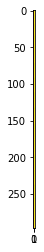

In [353]:
from matplotlib import pyplot as plt
import numpy as np
import cv2

 
plt.imshow(np.argwhere(mask_image_1 > 0.01))

In [343]:
cv2.imshow('Image', mask_image_1)

In [290]:
cv2.imshow("A New Image", mask_image)
cv2.imwrite("zero.jpg", mask_image)

True

In [467]:

width = clear_image.shape[1]
height = clear_image.shape[0]
resized_image = cv2.resize(clear_image, (int(width // 3.2), int(height // 3.2)))


In [468]:
cv2.imwrite("clear_resize.jpg", resized_image)

True

In [291]:
cv2.imwrite("filtered_zero.jpg", clear_image * mask_image)
    

True

In [293]:
a, b, clear_contours, clear_df, clear_binary = RGB_mask("/Users/codyyu/Downloads/pt25_ocf_code_0823/filtered_zero.jpg","/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output", 8)

Threshold value: 8
ID : 0
ID : 1
ID : 2
ID : 3
ID : 4
ID : 5
ID : 6
ID : 7
ID : 8
ID : 9
ID : 10
ID : 11
ID : 12
ID : 13
ID : 14
ID : 15
ID : 16
ID : 17
ID : 18
ID : 19
ID : 20
ID : 21
ID : 22
ID : 23
ID : 24
ID : 25
ID : 26
ID : 27
ID : 28
ID : 29
ID : 30
ID : 31
ID : 32
ID : 33
ID : 34
ID : 35
ID : 36
ID : 37
ID : 38
ID : 39
ID : 40
ID : 41
ID : 42
ID : 43
ID : 44
ID : 45
ID : 46
ID : 47
ID : 48
ID : 49
ID : 50
ID : 51
ID : 52
ID : 53
ID : 54
ID : 55
ID : 56
ID : 57
ID : 58
ID : 59
ID : 60
ID : 61
ID : 62
ID : 63
ID : 64
ID : 65
ID : 66
ID : 67
ID : 68
ID : 69
ID : 70
ID : 71
ID : 72
ID : 73
ID : 74
ID : 75
ID : 76
ID : 77
ID : 78
ID : 79
ID : 80
ID : 81
ID : 82
ID : 83
ID : 84
ID : 85
ID : 86
ID : 87
ID : 88
ID : 89
ID : 90
ID : 91
ID : 92
ID : 93
ID : 94
ID : 95
ID : 96
ID : 97
ID : 98
ID : 99
ID : 100
ID : 101
ID : 102
ID : 103
ID : 104
ID : 105
ID : 106
ID : 107
ID : 108
ID : 109
ID : 110
ID : 111
ID : 112
ID : 113
ID : 114
ID : 115
ID : 116
ID : 117
ID : 118
ID : 119
ID : 120
ID

In [360]:
df_sorted = df.sort_values(by=['x', 'y'])

: 

In [362]:
df_sorted

,id,x,y,area,perimeter,total_signal
1419,1419.0,5.0,35.0,149.0,48.142135,196.0
1356,1356.0,5.0,83.0,145.5,46.727922,175.0
1293,1293.0,5.0,131.0,142.0,46.142135,166.0
1230,1230.0,5.0,179.0,149.5,46.727922,139.0
1105,1105.0,5.0,275.0,150.0,47.313708,143.0
...,...,...,...,...,...,...
312,312.0,1492.0,892.0,213.0,56.142135,165.0
249,249.0,1492.0,940.0,206.0,54.970562,186.0
186,186.0,1492.0,988.0,205.0,56.142135,233.0
123,123.0,1492.0,1036.0,201.0,56.142135,177.0


In [237]:
mask = np.zeros_like(image)
cv2.drawContours(mask,[contours[0]],0, 255, -1)
res = cv2.bitwise_and(image,image,mask=mask)
idx = np.where( mask==255)


error: OpenCV(4.5.5) /Users/runner/work/opencv-python/opencv-python/opencv/modules/core/src/arithm.cpp:230: error: (-215:Assertion failed) (mtype == CV_8U || mtype == CV_8S) && _mask.sameSize(*psrc1) in function 'binary_op'


In [324]:
clear_binary

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [330]:
count = np.count_nonzero(clear_binary > 0)

In [331]:
count

374559

In [172]:
df.to_csv('mapping_test.csv', index=False)

In [ ]:
def filter_contours(image_path, output_path, ratio, ratio2=None):
    """
    Apply contour filtering based on aspect ratio and save the resulting image.

    Args:
        image_path (str): Path to the input grayscale image.
        output_path (str): Path to save the resulting filtered image.
        ratio (list): List with lower and upper bounds of aspect ratio.
        ratio2 (list, optional): Second set of aspect ratio bounds for filtering.

    Returns:
        numpy.ndarray: Filtered image with contours.
    """
    # Load the grayscale image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    contours, _ = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Create a copy of the original image
    image_with_rectangles = np.copy(image)
    
    #ratio is a list with first element as lower bound and second element as upper bound
    aspect_ratios = []
    filtered_contours = []
    for contour in contours:
        
        x, y, w, h = cv2.boundingRect(contour)
        cv2.rectangle(image_with_rectangles, (x, y), (x + w, y + h), (255), 1)  # Adjust color and thickness as needed
        
        aspect_ratio = float(w) / h
        if not ratio2:
            if aspect_ratio >= ratio[0] and aspect_ratio <= ratio[1]:
                filtered_contours.append(contour)
        else:
            if (aspect_ratio >= ratio[0] and aspect_ratio <= ratio[1]) or (aspect_ratio >= ratio2[0] and aspect_ratio <= ratio2[1]):
                filtered_contours.append(contour)
                
    #Check the images with bounding rectangles
    cv2.imwrite("bounding_rect.jpg", image_with_rectangles)
    
    # Create a mask of the filtered contours
    mask = np.zeros_like(image)
    cv2.drawContours(mask, filtered_contours, -1, (255), thickness=cv2.FILLED)
    
    # Save the filtered image to the specified output path
    cv2.imwrite(output_path, mask)
    return mask

In [484]:
from PIL import Image
import math

def plot_intensity_vs_x(image_name, minx, maxx, fixed_y):
    # Load the grayscale image
    image = image_name

    # Initialize lists to store the x-axis coordinates and y-axis intensities
    x_coordinates = []
    intensities = []

    # Iterate over each pixel in the image
    for x in range(minx, maxx):
        intensity = image[fixed_y, x]
        x_coordinates.append(x)
        intensities.append(intensity)
 
    # Plot the graph
    plt.scatter(x_coordinates, intensities)
    plt.xlabel('X Coordinates')
    plt.ylabel('Pixel Intensity')
    plt.title('Intensity vs X Coordinate')

    plot_path = os.path.dirname(image_name) + "/plots/"

    # Create the folder if it doesn't exist
    if not os.path.exists(plot_path):
        os.makedirs(plot_path)

    plt.savefig(os.path.dirname(image_name) + "/plots/" + os.path.basename(image_name) + "_vs_x.jpg")

    plt.show()

def plot_intensity_vs_y(image_name, fixed_x, y):
    # Load the grayscale image
    image = cv2.imread(image_name, cv2.IMREAD_GRAYSCALE)

    # Initialize lists to store the x-axis coordinates and y-axis intensities
    y_coordinates = []
    intensities = []

    # Iterate over each pixel in the image
    for y in range(y - 40, y + 40):
        intensity = image[y, fixed_x]
        y_coordinates.append(y)
        intensities.append(intensity)
        if intensity > 225:
            with open(os.path.dirname(image_name) + 'logfile.txt', "a") as f:
                print("{} is overexposed.".format(image_name), file=f)

    # Plot the graph
    plt.scatter(y_coordinates, intensities)
    plt.xlabel('Y Coordinates')
    plt.ylabel('Pixel Intensity')
    plt.title('Intensity vs Y Coordinate')

    plot_path = os.path.dirname(image_name) + "/plots/"

    # Create the folder if it doesn't exist
    if not os.path.exists(plot_path):
        os.makedirs(plot_path)

    plt.savefig(os.path.dirname(image_name) + "/plots/" + os.path.basename(image_name) + "_vs_y.jpg")

    plt.show()



In [485]:
maxX = 0
minX = 100000
meanY = 0
sum = 0
n = 0
for p in covered_pixels_mapping[0]:
    n = n + 1
    sum = p[1] + sum
    maxX = max(maxX, p[0])
    minX = min(minX, p[0])
meanY = (int) (sum // n)


TypeError: expected str, bytes or os.PathLike object, not ndarray

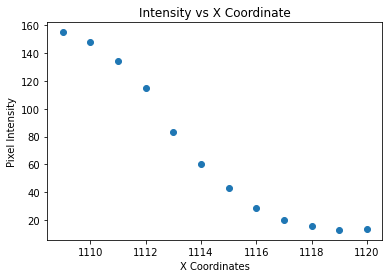

In [486]:
plot_intensity_vs_x(clear_image_4, minX, maxX, meanY)